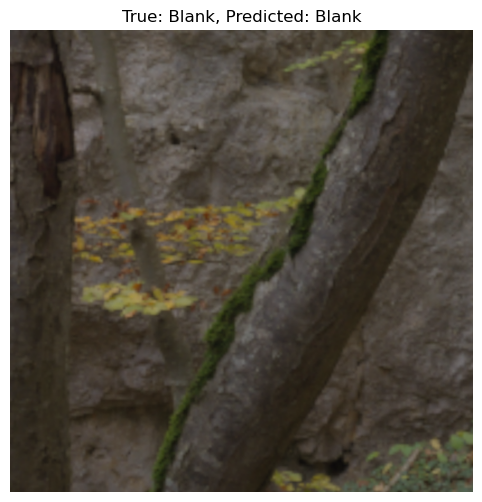

In [1]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model

# Define the classes and load the trained model
classes = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 
           'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 
           'W', 'X', 'Y', 'Z', 'Blank']
model = load_model('best_model.h5')

# Function to predict and compare true vs. predicted labels
def predict_and_compare(image_path):
    # Load and preprocess the image
    image = cv2.imread(image_path)
    image_resized = cv2.resize(image, (32, 32))
    image_array = np.expand_dims(image_resized.astype('float32')/255.0, axis=0)
    
    # Predict the label
    prediction = model.predict(image_array)
    predicted_label = classes[np.argmax(prediction)]
    
    # Extract the true label from the folder name
    true_label = os.path.basename(os.path.dirname(image_path))
    
    # Plot and compare
    plt.figure(figsize=(6, 6))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title(f"True: {true_label}, Predicted: {predicted_label}")
    plt.axis('off')
    plt.show()

# Example usage with a sample image
image_path = r"C:\Users\Nitesh\Downloads\new\Dataset\Test_Alphabet\Blank\a82719b5-8c43-4d48-bd1b-b2eb8c182cbe.rgb_0000.png"  # Provide the path to your image here
predict_and_compare(image_path)


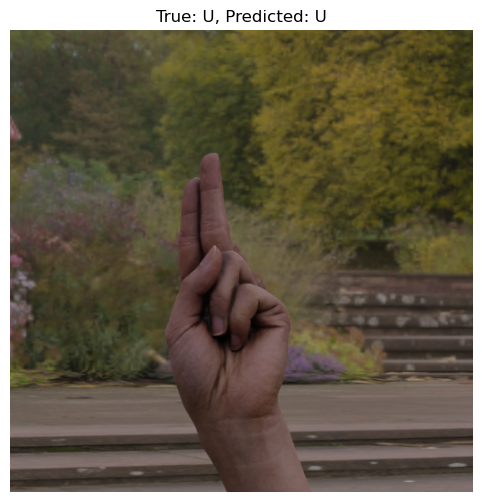

In [2]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model

# Define the classes and load the trained model
classes = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 
           'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 
           'W', 'X', 'Y', 'Z', 'Blank']
model = load_model('best_model.h5')

# Function to predict and compare true vs. predicted labels
def predict_and_compare(image_path):
    # Load and preprocess the image
    image = cv2.imread(image_path)
    image_resized = cv2.resize(image, (32, 32))
    image_array = np.expand_dims(image_resized.astype('float32')/255.0, axis=0)
    
    # Predict the label
    prediction = model.predict(image_array)
    predicted_label = classes[np.argmax(prediction)]
    
    # Extract the true label from the folder name
    true_label = os.path.basename(os.path.dirname(image_path))
    
    # Plot and compare
    plt.figure(figsize=(6, 6))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title(f"True: {true_label}, Predicted: {predicted_label}")
    plt.axis('off')
    plt.show()

# Example usage with a sample image
image_path = r"C:\Users\Nitesh\Downloads\new\Dataset\Test_Alphabet\U\fde15a69-528f-4331-9d6a-8b2d487c4c20.rgb_0000.png"  # Provide the path to your image here
predict_and_compare(image_path)


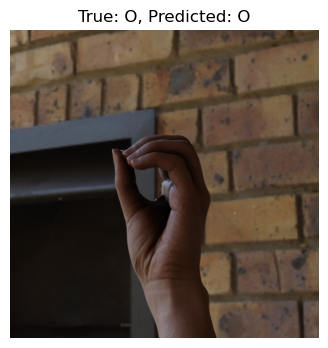

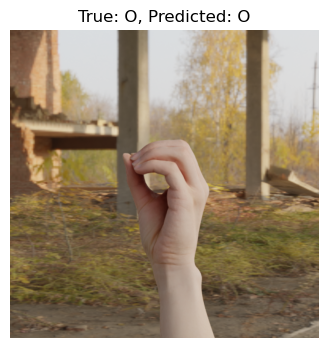

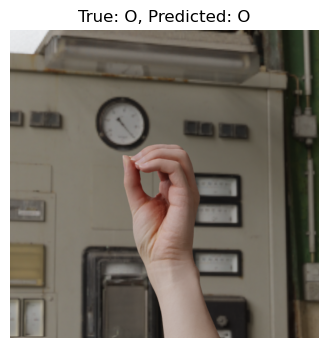

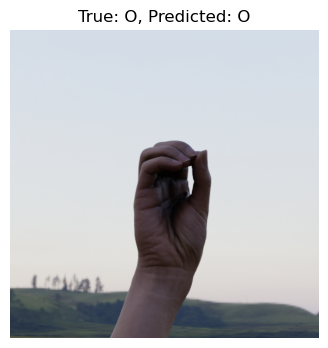

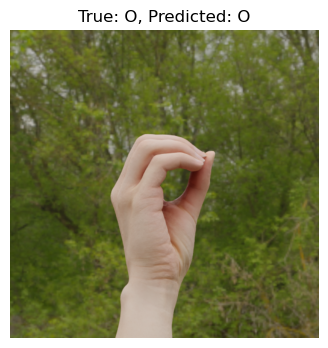

...

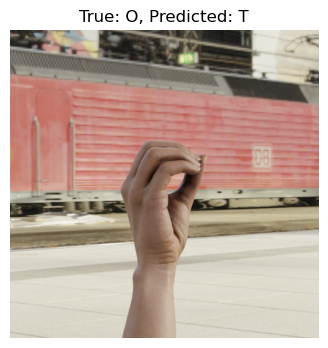

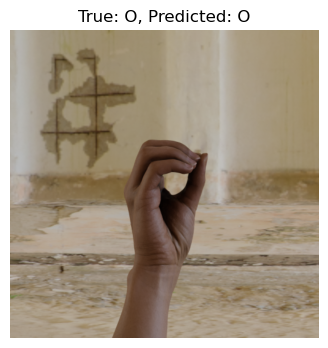

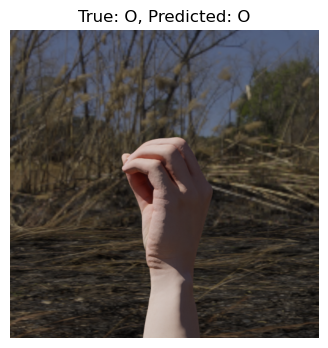

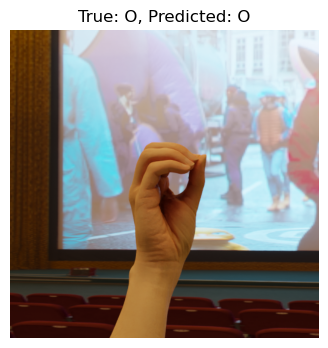

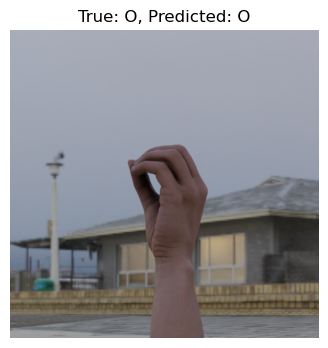


Overall Accuracy: 93.00%


In [3]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model
from sklearn.metrics import accuracy_score

# Define the classes and load the trained model
classes = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 
           'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 
           'W', 'X', 'Y', 'Z', 'Blank']
model = load_model('best_model.h5')

# Function to predict and compare true vs. predicted labels for all images in a folder
def predict_all_in_folder(folder_path):
    true_labels = []
    predicted_labels = []
    
    for subdir, dirs, files in os.walk(folder_path):
        for file in files:
            if file.endswith(('.jpg', '.png', '.jpeg')):
                image_path = os.path.join(subdir, file)
                
                # Load and preprocess the image
                image = cv2.imread(image_path)
                image_resized = cv2.resize(image, (32, 32))
                image_array = np.expand_dims(image_resized.astype('float32')/255.0, axis=0)
                
                # Predict the label
                prediction = model.predict(image_array)
                predicted_label = classes[np.argmax(prediction)]
                
                # Extract the true label from the folder name
                true_label = os.path.basename(subdir)
                
                # Store true and predicted labels
                true_labels.append(true_label)
                predicted_labels.append(predicted_label)
                
                # Plot and compare
                plt.figure(figsize=(4, 4))
                plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
                plt.title(f"True: {true_label}, Predicted: {predicted_label}")
                plt.axis('off')
                plt.show()
    
    # Calculate and print the overall accuracy
    accuracy = accuracy_score(true_labels, predicted_labels)
    print(f"\nOverall Accuracy: {accuracy * 100:.2f}%")

# Example usage with a folder path
folder_path = r"C:\Users\Nitesh\Downloads\new\Dataset\Test_Alphabet\O"  # Provide the path to your folder here
predict_all_in_folder(folder_path)


Classification Report:
              precision    recall  f1-score   support

           A       0.96      0.94      0.95       100
           B       0.96      0.96      0.96       100
           C       0.96      0.98      0.97       100
           D       1.00      1.00      1.00       100
           E       1.00      0.88      0.94       100
           F       0.98      0.93      0.95       100
           G       1.00      0.96      0.98       100
           H       0.98      0.95      0.96       100
           I       0.97      0.97      0.97       100
           J       0.99      0.97      0.98       100
           K       0.83      0.96      0.89       100
           L       0.94      0.98      0.96       100
           M       0.88      1.00      0.93       100
           N       0.88      0.97      0.92       100
           O       0.94      0.92      0.93       100
           P       0.95      0.93      0.94       100
           Q       0.97      0.90      0.93       100
    

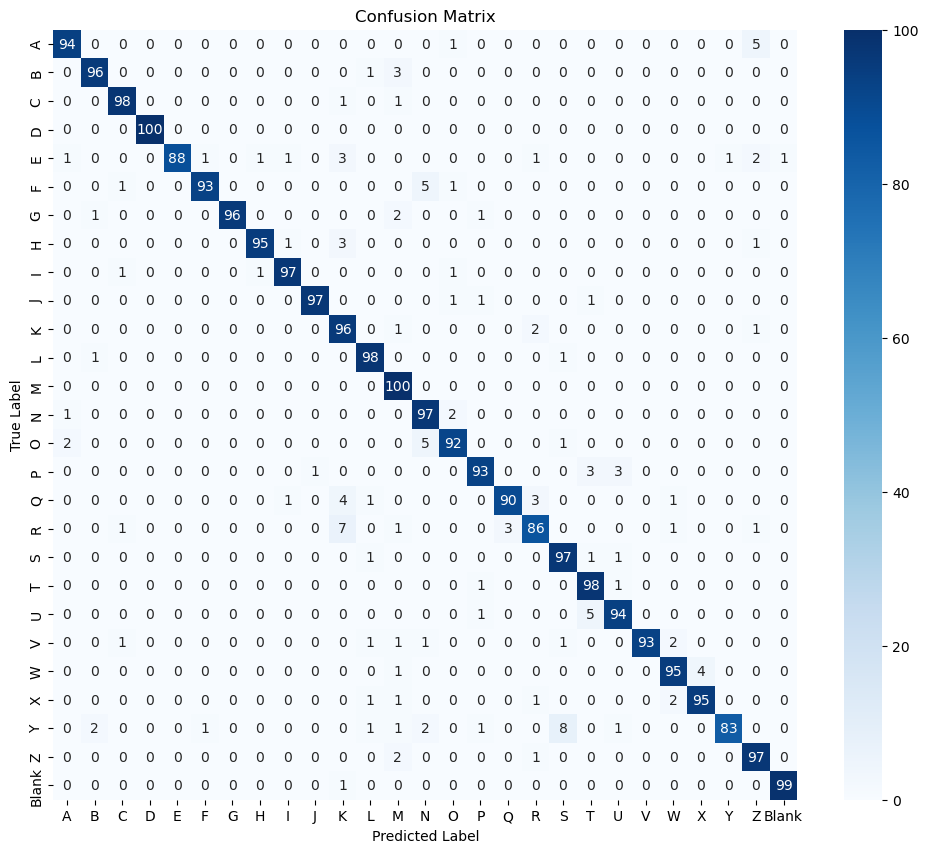

In [7]:
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Ensure true_labels and predicted_labels are defined from the previous cell
if 'true_labels' in globals() and 'predicted_labels' in globals():
    # Compute and print metrics
    print("Classification Report:")
    print(classification_report(true_labels, predicted_labels, target_names=classes))

    # Compute confusion matrix
    conf_matrix = confusion_matrix(true_labels, predicted_labels)

    # Plot confusion matrix
    plt.figure(figsize=(12, 10))
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=classes, yticklabels=classes)
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.title('Confusion Matrix')
    plt.show()
else:
    print("true_labels and predicted_labels are not defined. Please run the prediction cell first.")
